In [1]:
%pip install segmentation_models_pytorch -q

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [2]:
import copy
import os
import random
from datetime import datetime

import cv2
import matplotlib.pyplot as plt
import numpy as np
import segmentation_models_pytorch as smp
import torch
import torch.optim as optim
from PIL import Image
from skimage.util import random_noise
from torch.utils.data import DataLoader
from torchvision import transforms
from tqdm import tqdm

In [3]:
import os

import cv2
import torch
from sklearn.model_selection import train_test_split


def default_aug(image, mask):
    return image, mask


def default_preprocessing(image):
    return torch.from_numpy(image).permute(2, 0, 1).float()


class SegmentationDataset(torch.utils.data.Dataset):
    def __init__(
        self,
        tiles,
        masks,
        augmentations,  # Augmentations
        preprocessing,  # Processing data for the model
    ):
        self.has_mask = masks is not None
        self.tiles = tiles
        self.masks = masks
        self.augmentations = augmentations
        self.preprocessing = preprocessing

    def __len__(self):
        return len(self.tiles)

    def get_item(self, idx):
        image = self.tiles[idx]
        mask = None
        if self.has_mask:
            mask = self.masks[idx]
        image, mask = self.augmentations(image, mask)
        if self.has_mask:
            mask = torch.from_numpy(mask).float()
        before_preprocessing = image
        image = self.preprocessing(image)

        return image, mask, before_preprocessing

    def __getitem__(self, idx):
        image, mask, before_preprocessing = self.get_item(idx)
        if self.has_mask:
            return image, mask
        return image


def get_tiles(
    tile_size,
    path_to_pics,
    path_to_masks=None,  # None if there are no labels
):
    images = []
    masks = None
    
    # Pictures loading
    print('Pictures')
    for root, dirs, files in os.walk(path_to_pics):
        for file in tqdm(sorted(files)):
            img = cv2.imread(os.path.join(root, file))
            h, w, _ = img.shape

            for h_coord in range(0, h // tile_size):
                for w_coord in range(0, w // tile_size):
                    y = h_coord * tile_size
                    x = w_coord * tile_size
                    images.append(img[y : y + tile_size, x : x + tile_size])
    
    # Masks loading
    print('Masks')
    if path_to_masks is not None:
        masks = []
        for root, dirs, files in os.walk(path_to_masks):
            for file in tqdm(sorted(files)):
                mask = cv2.imread(os.path.join(root, file))
                mask = (mask[:, :, 0] > 0).astype("uint8")
                h, w = mask.shape
                for h_coord in range(0, h // tile_size):
                    for w_coord in range(0, w // tile_size):
                        y = h_coord * tile_size
                        x = w_coord * tile_size
                        now_mask = mask[y : y + tile_size, x : x + tile_size]
                        #if now_mask.sum() == 0:
                        #    masks.append(None)
                        #    continue
                        masks.append(now_mask)
        
        # If trained without empty masks, this method removed empty masks
        print('Erasing Nones')
        for ind in tqdm(range(len(masks) - 1, -1, -1)):
            if masks[ind] is None:
                images.pop(ind)
                masks.pop(ind)
                        
    return images, masks


def get_datasets(
    tile_size,
    path_to_pics,
    path_to_masks=None,
    augmentations=default_aug,            # Augmentations
    preprocessing=default_preprocessing,  # Processing data for the model
):
    tiles, masks = get_tiles(tile_size, path_to_pics, path_to_masks)
    train_tiles, val_tiles, train_masks, val_masks = train_test_split(
        tiles, masks, test_size=0.2, random_state=42
    )
    train_dataset = SegmentationDataset(
        train_tiles, train_masks, augmentations, preprocessing
    )
    val_dataset = SegmentationDataset(val_tiles, val_masks, default_aug, preprocessing)
    return train_dataset, val_dataset

In [4]:
BACKBONE = "efficientnet-b5"
PRETRAIN = "imagenet"
preprocessing_fn = smp.encoders.get_preprocessing_fn(BACKBONE, pretrained=PRETRAIN)


def preprocessing(image):
    image = preprocessing_fn(image)
    return torch.from_numpy(image).permute(2, 0, 1).float()


def augmentations(image, mask):
    if random.randint(1, 2) == 1:
        image = cv2.flip(image, 1)
        mask = cv2.flip(mask, 1)
    if random.randint(1, 2) == 1:
        image = cv2.flip(image, 0)
        mask = cv2.flip(mask, 0)
    ch_col = random.randint(80, 120) / 100
    image = image.astype("float64") * ch_col
    image[image > 255] = 255
    image = image.astype("uint8")
    return image, mask


dataset_train, dataset_val = get_datasets(
    512,
    "train/images",
    "train/masks",
    augmentations=augmentations,
    preprocessing=preprocessing,
)

Pictures


100%|██████████| 21/21 [00:25<00:00,  1.23s/it]


Masks


100%|██████████| 21/21 [00:09<00:00,  2.12it/s]


Erasing Nones


100%|██████████| 2924/2924 [00:00<00:00, 2503397.61it/s]


In [5]:
import torch
import torch.nn as nn

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=32, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 64, 4, 4, 0, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 1, 4, 4, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# We create a discriminator: a model that will evaluate the similarity of the mask to the marked one
D = Discriminator()

# Testing with random input
test_input = torch.randn(1, 1, 512, 512)
output = D(test_input)
print(output.shape)  # Should be (1, 1, 1, 1)

torch.Size([1, 1, 1, 1])


In [6]:
dataloader_train = DataLoader(dataset_train, batch_size=12, shuffle=True)
dataloader_val = DataLoader(dataset_val, batch_size=12, shuffle=False)

In [7]:
model = smp.Unet(encoder_name=BACKBONE, in_channels=3, classes=1, activation="sigmoid")

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b5-b6417697.pth" to /tmp/xdg_cache/torch/hub/checkpoints/efficientnet-b5-b6417697.pth
100%|██████████| 117M/117M [00:01<00:00, 68.9MB/s] 


In [8]:
model.load_state_dict(torch.load('models/unet-efficientnet-b5_0.8803.pth'))

<All keys matched successfully>

In [9]:
%pip install wandb -q

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [10]:
import numpy
import torch
import wandb
from tqdm import tqdm

TEAM_NAME = "knife_team"
PROJECT_NAME = "building-segmentation"


class SegmentationModel:
    def __init__(
        self, model: torch.nn.Module, D, model_name: str = "model", device="cuda"
    ):
        self.device = device
        self.model = model.to(device)
        self.D = D.to(device)
        self.model_name = model_name

    def __call__(self, x):
        return self.model(x)

    def train(
        self,
        loss_g,
        loss_d,
        train_loader,
        val_loader,
        metrics: dict,
        optimizer_g,
        optimizer_d,
        target_metric="f1_g",
        epochs=2,
        wandb_logging=False,
        path_to_save_model=None,
        verbose=True,
    ):
        if wandb_logging:
            run = wandb.init(
                entity=TEAM_NAME,
                project=PROJECT_NAME,
                config={
                    "architecture": self.model_name,
                    "epochs": epochs,
                    "batch_size": train_loader.batch_size,
                    "optimizer_g": optimizer_g.__class__.__name__,
                    "optimizer_d": optimizer_d.__class__.__name__,
                    "loss_g": loss_g.__class__.__name__,
                    "loss_d": loss_d.__class__.__name__,
                    "lr": optimizer.param_groups[0]["lr"],
                    "target_metric": target_metric,
                },
            )

        best_metric = 0
        train_logs_list, valid_logs_list = [], []

        for epoch in range(1, epochs + 1):
            self.model.train()
            results = {}
            
            # Add metrics
            for metric_name, (metric, g_or_d) in metrics.items():
                results[metric_name] = []
            results["train_loss"] = []
            results["train_loss_D"] = []

            pbar = tqdm(enumerate(train_loader), total=len(train_loader))
            pbar.set_description(f"Epoch {epoch}")
            
            # Train cycle
            for batch_idx, (data, target) in pbar:
                data, target = data.to(self.device), target.to(self.device).unsqueeze(1)
                optimizer_g.zero_grad()
                
                real_labels = 1 - torch.rand(data.size(0), 1, 1, 1).to(self.device) * 0.3
                fake_labels = torch.rand(data.size(0), 1, 1, 1).to(self.device) * 0.3
                
                # Discriminator training
                optimizer_d.zero_grad()
                real_outputs = D(target)
                loss_real = loss_d(real_outputs, real_labels)

                fake_masks = self.model(data)
                fake_outputs = D(fake_masks.detach())
                loss_fake = loss_d(fake_outputs, fake_labels)

                loss_D = loss_real + loss_fake
                loss_D.backward()
                optimizer_d.step()
                
                # Segmentation model training
                fake_outputs = D(fake_masks)
                loss_gan = loss_d(fake_outputs, real_labels)

                loss_segmentation = loss_g(fake_masks, target)
                
                loss_model = 0.1 * loss_gan + 0.9 * loss_segmentation
                loss_model.backward()
                optimizer_g.step()
                
                # Train metrics
                results["train_loss"].append(loss_model.item())
                results["train_loss_D"].append(loss_D.item())
                for metric_name, (metric, g_or_d) in metrics.items():
                    if g_or_d == 'g':
                        results[metric_name].append(
                            metric(fake_masks, target).detach().cpu().item()
                        )
                    else:
                        fake_labels = torch.zeros(data.size(0), 1, 1, 1).to(self.device)
                        real_labels = torch.ones(data.size(0), 1, 1, 1).to(self.device)
                        outputs = torch.cat((real_outputs, fake_outputs), 0)
                        labels = torch.cat((real_labels, fake_labels), 0)
                        results[metric_name].append(
                            metric(outputs, labels).detach().cpu().item()
                        )

                pbar.set_postfix(
                    {
                        "loss_g": numpy.mean(results["train_loss"]),
                        "loss_d": numpy.mean(results["train_loss_D"]),
                    }
                )
            
            results["train_loss"] = numpy.mean(results["train_loss"])
            results["train_loss_D"] = numpy.mean(results["train_loss_D"])
            for metric_name, (metric, g_or_d) in metrics.items():
                results[metric_name] = numpy.mean(results[metric_name])

            train_logs_list.append(results)
            if verbose:
                print(f"Train logs: {results}")

            results = {}
            for metric_name, (metric, g_or_d) in metrics.items():
                results[metric_name] = []
            results["val_loss"] = []
            
            # Validation
            self.model.eval()
            with torch.no_grad():
                for batch_idx, (data, target) in tqdm(
                    enumerate(val_loader), total=len(val_loader)
                ):
                    data, target = data.to(self.device), target.to(
                        self.device
                    ).unsqueeze(1)
                    output = self.model(data)
                    loss_value = loss_g(output, target)

                    results["val_loss"].append(loss_value.item())
                    for metric_name, (metric, g_or_d) in metrics.items():
                        if g_or_d == 'g':
                            results[metric_name].append(
                                metric(output, target).detach().cpu().item()
                            )
                        else:
                            results[metric_name].append(4444)

            results["val_loss"] = numpy.mean(results["val_loss"])
            for metric_name, (metric, g_or_d) in metrics.items():
                results[metric_name] = numpy.mean(results[metric_name])
            valid_logs_list.append(results)

            if verbose:
                print(f"Val logs: {results}")
            
            # Saving the model
            if results[target_metric] > best_metric:
                print(f"New best model! Val {target_metric}: {results[target_metric]}")
                best_metric = results[target_metric]
                if path_to_save_model is not None:
                    model_path = os.path.join(
                        path_to_save_model,
                        f"{self.model_name}_{round(best_metric, 4)}.pth",
                    )
                    torch.save(self.model.state_dict(), model_path)

            if wandb_logging:
                wandb.log(
                    {
                        "train_loss": train_logs_list[-1]["train_loss"],
                        "train_loss_D": train_logs_list[-1]["train_loss_D"],
                        "val_loss": valid_logs_list[-1]["val_loss"],
                    }
                )

                for metric_name, (metric, g_or_d) in metrics.items():
                    wandb.log(
                        {
                            f"train_{metric_name}": train_logs_list[-1][metric_name],
                            f"val_{metric_name}": valid_logs_list[-1][metric_name],
                        }
                    )

        if wandb_logging:
            run.finish()

        return train_logs_list, valid_logs_list

    def predict(self, test_loader):
        self.model.eval()
        with torch.no_grad():
            predictions = []
            for batch_idx, data in tqdm(enumerate(test_loader), total=len(test_loader)):
                try:
                    data, target = data
                    data, target = data.to(self.device), target.to(
                        self.device
                    ).unsqueeze(1)
                except TypeError:
                    data = data.to(self.device)
                output = self.model(data).detach().cpu().numpy()
                for part in output:
                    predictions.append(part[0])

        return predictions

In [11]:
model_train = SegmentationModel(model, D, "gan")

In [12]:
wandb.login(key="")

/usr/local/lib/python3.10/dist-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (2.0.7) or chardet (4.0.0)/charset_normalizer (3.3.2) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "
wandb: Currently logged in as: knifeman (knife_team). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/jupyter/.netrc


True

In [13]:
from segmentation_models_pytorch import utils

f1_score = smp.utils.metrics.Fscore(threshold=0.5)
def my_f1_score(y_pred, y_true):
    score = (f1_score(y_pred, y_true) + f1_score(1 - y_pred, 1 - y_true)) / 2
    return score


def my_dice_loss(p, y):
    loss = 1 - (2 * (p * y).sum() + 1) / (p.sum() + y.sum() + 1)
    return loss


criterion = my_dice_loss
loss_d = nn.BCELoss()
optimizer_g = optim.Adam(model.parameters(), lr=3e-4)
optimizer_d = optim.Adam(D.parameters(), lr=3e-4)
metrics = {
    'f1_g': (my_f1_score, 'g'),
    'iou_g': (smp.utils.metrics.IoU(threshold=0.5), 'g'),
    'acc_d': (smp.utils.metrics.Accuracy(threshold=0.5), 'd')
}
model_train.train(
    criterion,
    loss_d,
    dataloader_train,
    dataloader_val,
    metrics,
    optimizer_g,
    optimizer_d,
    wandb_logging=False,
    path_to_save_model="models",
)

Epoch 1: 100%|██████████| 195/195 [02:40<00:00,  1.22it/s, loss_g=0.246, loss_d=1.4]


Train logs: {'f1_g': 0.8959116382476611, 'iou_g': 0.6773890065841186, 'acc_d': 0.5076923205302312, 'train_loss': 0.24608773627342323, 'train_loss_D': 1.397926029180869}


100%|██████████| 49/49 [00:14<00:00,  3.49it/s]

Val logs: {'f1_g': 0.899414141567386, 'iou_g': 0.6859699584999863, 'acc_d': 4444.0, 'val_loss': 0.18832377633269953}
New best model! Val f1_g: 0.899414141567386



Epoch 2: 100%|██████████| 195/195 [02:38<00:00,  1.23it/s, loss_g=0.241, loss_d=1.39]


Train logs: {'f1_g': 0.8977104712755252, 'iou_g': 0.6823190426215148, 'acc_d': 0.5136752253923661, 'train_loss': 0.24093392376716322, 'train_loss_D': 1.3888382171973204}


100%|██████████| 49/49 [00:13<00:00,  3.51it/s]

Val logs: {'f1_g': 0.8982601469876815, 'iou_g': 0.6828893550804683, 'acc_d': 4444.0, 'val_loss': 0.19068682680324633}


([{'f1_g': 0.8959116382476611,
   'iou_g': 0.6773890065841186,
   'acc_d': 0.5076923205302312,
   'train_loss': 0.24608773627342323,
   'train_loss_D': 1.397926029180869},
  {'f1_g': 0.8977104712755252,
   'iou_g': 0.6823190426215148,
   'acc_d': 0.5136752253923661,
   'train_loss': 0.24093392376716322,
   'train_loss_D': 1.3888382171973204}],
 [{'f1_g': 0.899414141567386,
   'iou_g': 0.6859699584999863,
   'acc_d': 4444.0,
   'val_loss': 0.18832377633269953},
  {'f1_g': 0.8982601469876815,
   'iou_g': 0.6828893550804683,
   'acc_d': 4444.0,
   'val_loss': 0.19068682680324633}])

In [14]:
predictions = model_train.predict(dataloader_val)

100%|██████████| 49/49 [00:14<00:00,  3.46it/s]


In [15]:
def visualize(figsize=(20, 10), **images):
    """
    :param figsize: A tuple (width, height) specifying the size of the figure. Default is (20, 10).
    :param images: Keyword arguments where the key is the name of the image and the value is the corresponding image data.
    :return: None

    This method takes in multiple images and displays them in a grid layout using matplotlib. It supports numpy arrays and torch tensors as image data. The figsize parameter allows you to specify the size of the figure. Each image will be displayed with its corresponding name as the title.

    Examples:
        visualize(figsize=(10, 5), image1=image_data1, image2=image_data2)
    """
    n_images = len(images)
    plt.figure(figsize=figsize)
    for idx, (name, image) in enumerate(images.items()):
        if isinstance(image, torch.Tensor):
            image = image.detach().cpu().numpy()
            if image.shape[0] == 1:
                image = image[0]

            if len(image.shape) == 3:
                image = image.transpose(1, 2, 0)

        if not isinstance(image, np.ndarray):
            raise ValueError(
                f"Image must be numpy array or torch tensor. Got {type(image)}"
            )
        if image.shape[-1] == 1:
            image = image[:, :, 0]

        plt.subplot(1, n_images, idx + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(name.replace("_", " ").title(), fontsize=20)
        plt.imshow(image)
    plt.show()

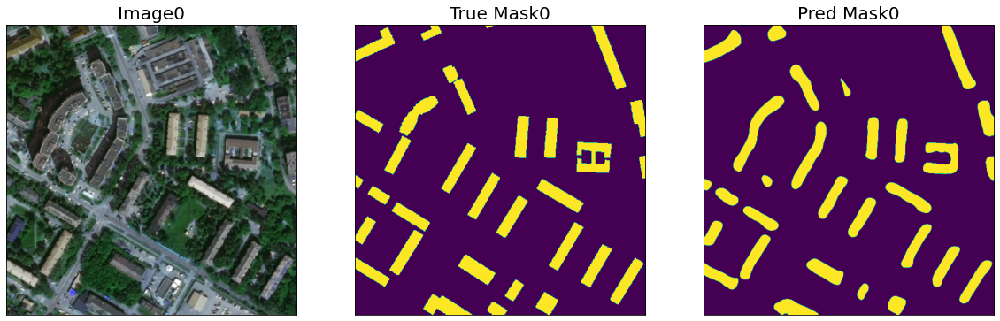

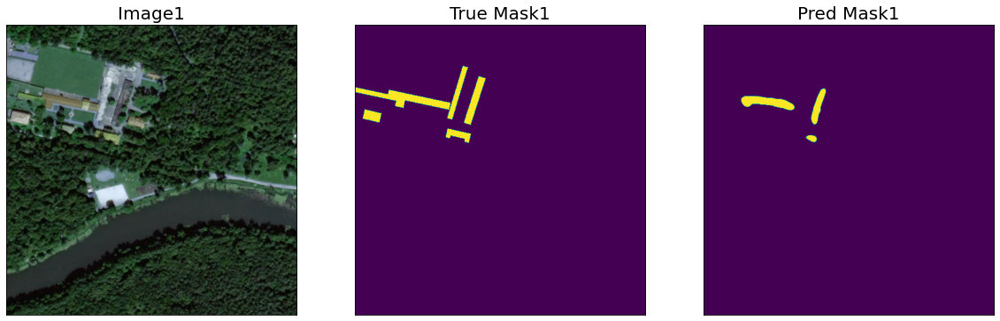

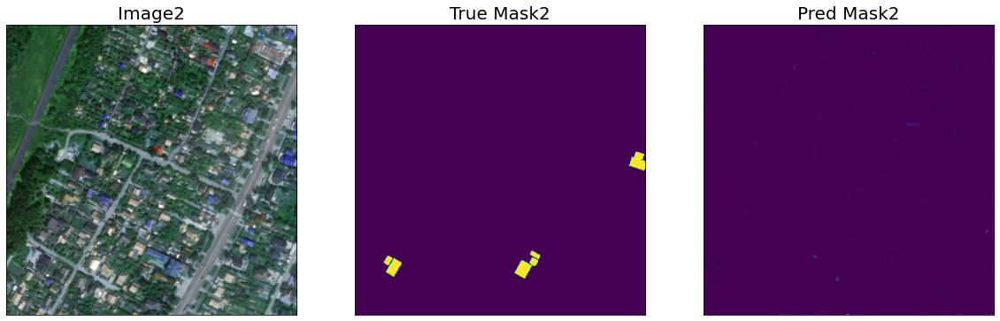

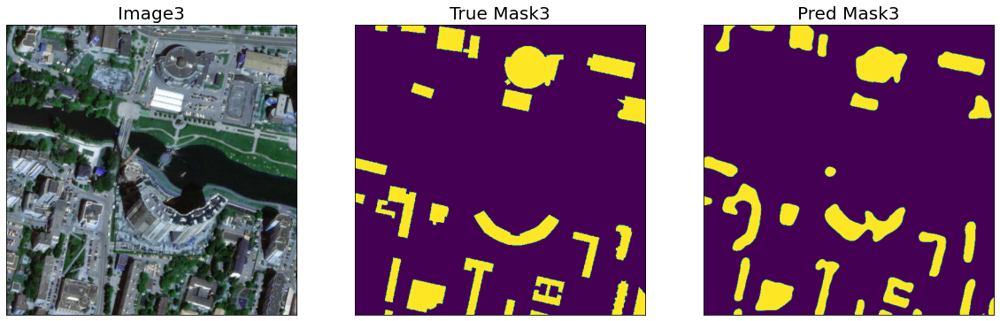

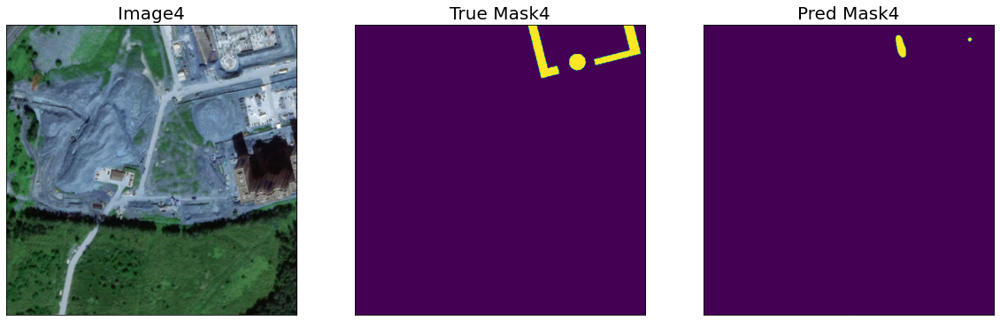

...

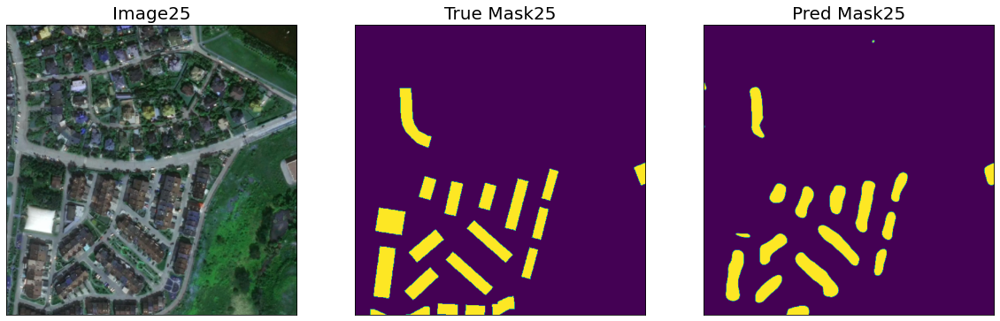

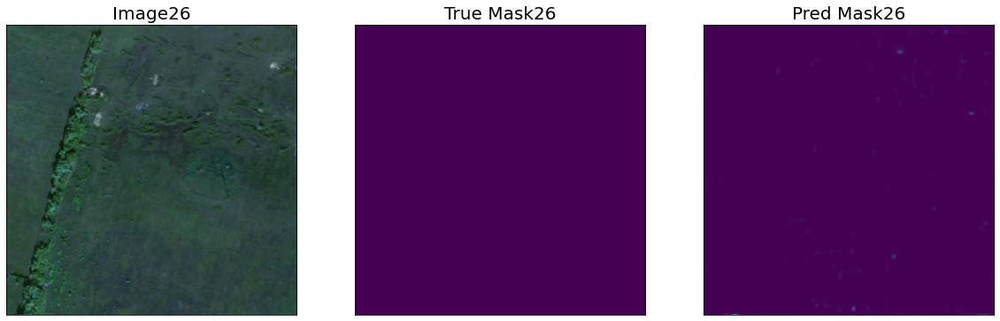

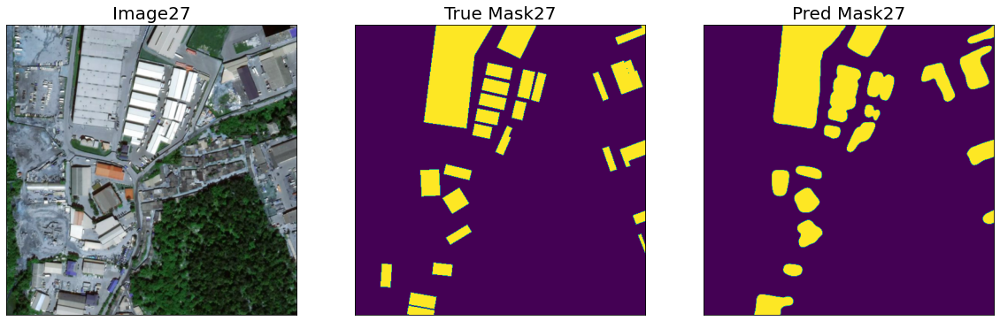

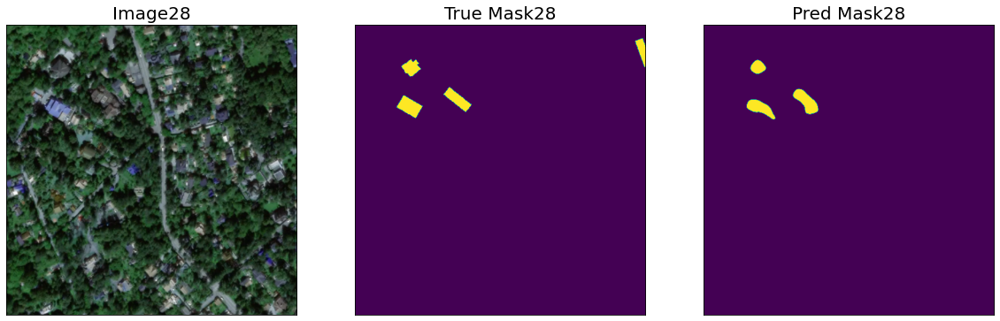

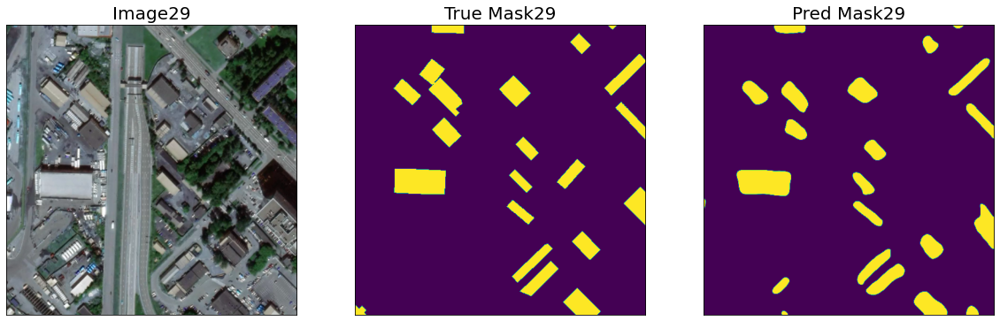

In [16]:
for i in range(30):
    params_vis = {}
    params_vis[f"image{i}"] = dataset_val.get_item(i)[2]
    params_vis[f"true_mask{i}"] = dataset_val.get_item(i)[1]
    params_vis[f"pred_mask{i}"] = predictions[i]
    visualize(figsize=(20, 10), **params_vis)